# DeepForest - ESA Stats Seminar 2025

The aim of this tutorial is to demonstrate the use of the DeepForest package for object detection in aerial imagery. We will work today to identify birds in drone images. DeepForest docs are here! 

https://deepforest.readthedocs.io

1. Load a model
2. Split the orthomosaic into tiles
3. Predict on the tiles
4. Merge the predictions
5. Visualize the results
6. Split train-test
7. Evaluate the results

# Download data


In [1]:
import requests
import zipfile
import io
import os   

# Check if files already exist in data directory
if os.path.exists("data/DeepWaterHorizon") and os.path.exists("data/DeepWaterHorizon"):
    print("Files already downloaded:")
    for f in os.listdir("data"):
        print(f"- {f}")
else:

    # Download zip file from Dropbox
    url = "https://www.dropbox.com/scl/fo/p7mm97e9xo7a3gqtcs1cd/ANQ_YnFlOhkP-t7hc8At3_k?rlkey=c4eik22p4m1t1q4wct0cnk7ra&dl=1"
    response = requests.get(url)

    # Create data directory if it doesn't exist
    os.makedirs("data", exist_ok=True)

    # Extract zip contents
    with zipfile.ZipFile(io.BytesIO(response.content)) as zip_ref:
        zip_ref.extractall("data")
        
    # Get list of extracted files
    files = os.listdir("data")
    print("Downloaded files:")
    for f in files:
        print(f"- {f}")


Files already downloaded:
- crops
- temp_train.csv
- temp_test.csv
- DeepWaterHorizon


## Load a model

DeepForest comes with several prebuilt models, for trees, birds, livestock, and other custom projects. We are open to creating and hosting more models based on the community needs.

In [2]:
from deepforest import main
import os
model = main.deepforest()
model.load_model("weecology/deepforest-bird")

/blue/ewhite/b.weinstein/miniconda3/envs/BOEM/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/blue/ewhite/b.weinstein/miniconda3/envs/BOEM/lib/python3.10/site-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.24 (you have 1.4.22). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


Reading config file: /blue/ewhite/b.weinstein/miniconda3/envs/BOEM/lib/python3.10/site-packages/deepforest/data/deepforest_config.yml


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Reading config file: /blue/ewhite/b.weinstein/miniconda3/envs/BOEM/lib/python3.10/site-packages/deepforest/data/deepforest_config.yml


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


# Make initial predictions and view

We always think of DeepForest as the starting place for model development. The model is note intended to be used as a zero-shot tool. we expect that the model will be trained on a small dataset and then used to make predictions on a larger dataset. 

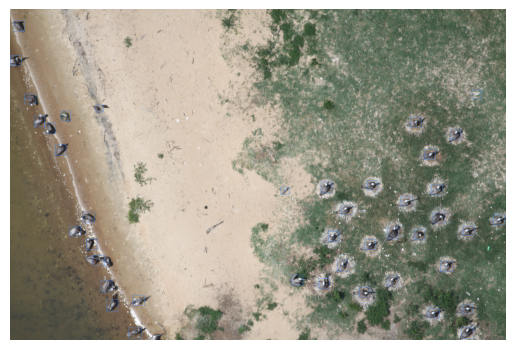

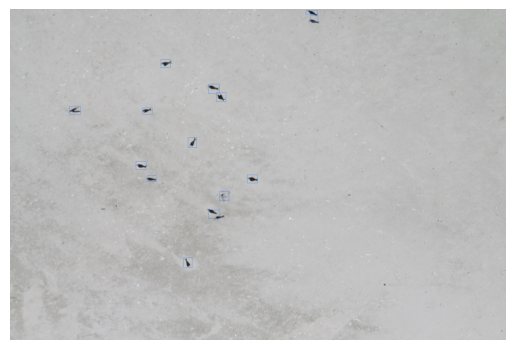

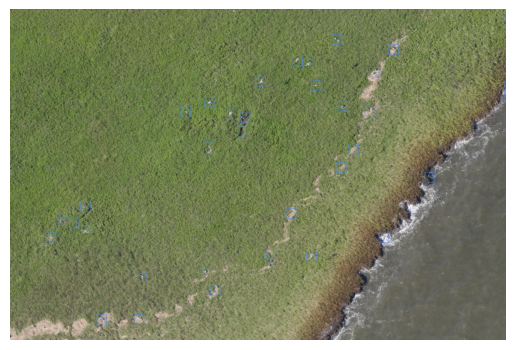

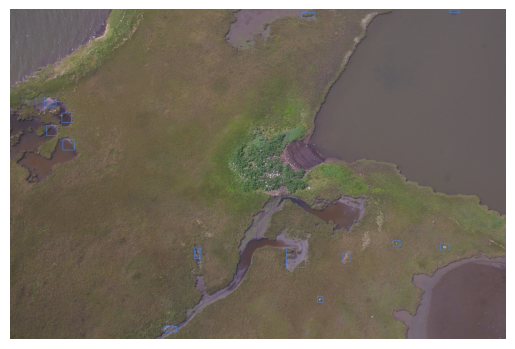

In [3]:
from deepforest import visualize
import glob
images = glob.glob("data/DeepWaterHorizon/*")
zero_shot_predictions = []

# Make predictions on the first 4 images
for image in images[:4]:
    predictions = model.predict_image(path=image)
    zero_shot_predictions.append(predictions)
    visualize.plot_results(predictions)

These images show adequate results, but can be improved with local annotations

## Annotate data in target imagery

We use label-studio to annotate data in target imagery. Data can be exported as pascal voc or COCO format. 

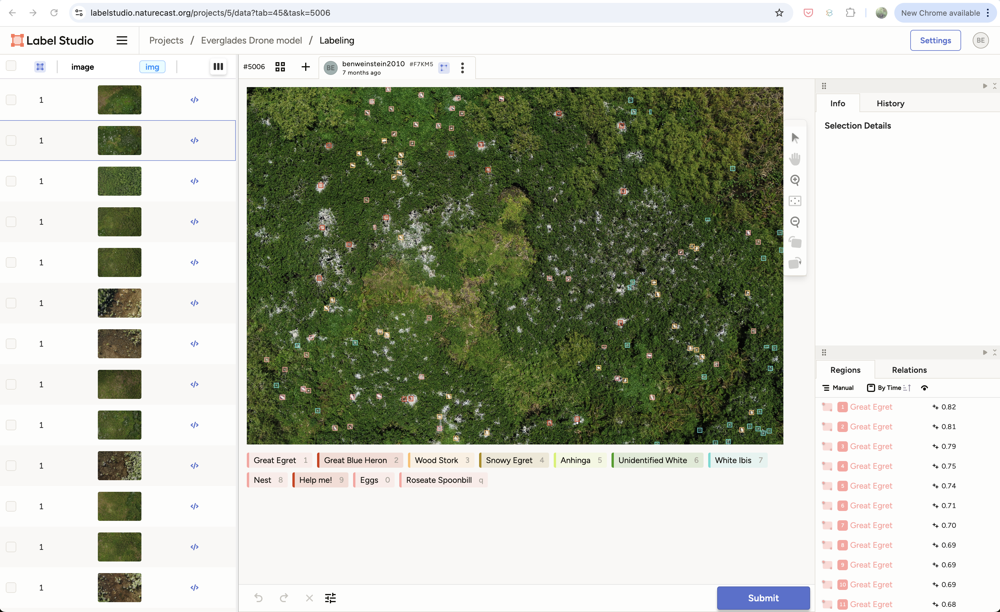

## Load annotations
The deepforest.utilities.read_file function can load csv, shapefiles, or xml formats. 

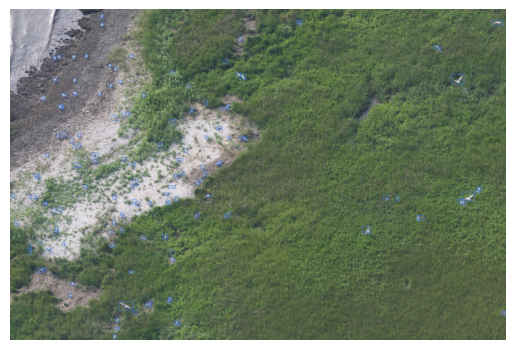

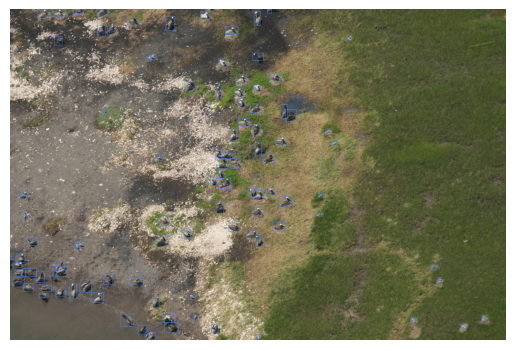

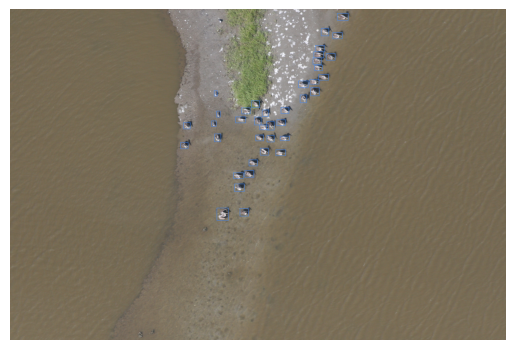

In [4]:
from deepforest.utilities import read_file
from deepforest import visualize

annotations = read_file("data/DeepWaterHorizon/annotations.csv")
annotations.head()

# plot a couple images with annotations
image = "data/DeepWaterHorizon/20240715_140000_0000_RGB.tif"
image_annotations = annotations[annotations.image_path == annotations.image_path.unique()[0]]
image_annotations.root_dir = "data/DeepWaterHorizon"
visualize.plot_results(image_annotations)

image_annotations = annotations[annotations.image_path == annotations.image_path.unique()[1]]
image_annotations.root_dir = "data/DeepWaterHorizon"
visualize.plot_results(image_annotations)

image_annotations = annotations[annotations.image_path == annotations.image_path.unique()[2]]
image_annotations.root_dir = "data/DeepWaterHorizon"
visualize.plot_results(image_annotations)


## Optionally split the annotations into train and test

We believe the training data should have biological meaning. Random splits are not recommended. Instead, we recommend splitting data as you actually want to use it, accross survey effects or time, or species. In this case, the images are split randomly since they are not grouped by survey or time. 

In [5]:
# Split the first 4 images into test
import pandas as pd
images = annotations.image_path.unique()
test_images = images[:4]
train_images = images[4:]

annotations = pd.read_csv("data/DeepWaterHorizon/annotations.csv")
annotations = annotations[annotations.label == "Bird"]
test_annotations = annotations[annotations.image_path.isin(test_images)]
train_annotations = annotations[~annotations.image_path.isin(test_images)]


# Save the annotations
test_annotations.to_csv("data/DeepWaterHorizon/test_annotations.csv", index=False)
train_annotations.to_csv("data/DeepWaterHorizon/train_annotations.csv", index=False)


###  Fine-tune example

The key parameter is the learning rate. Faster learning rates make the model learn more quickly, but also cause it to forgot more of that it already knew. Its best to test a few tries carefully. A default around 0.0001 is often a good guess.

In [6]:
%timeit

# Comment out if comet-ml is not installed
import comet_ml
from pytorch_lightning.loggers import CometLogger
comet_logger = CometLogger()

# Just reload here to make sure we are starting from the same model
model = main.deepforest()
model.load_model("weecology/deepforest-bird")

model.config["train"]["csv_file"] = "data/DeepWaterHorizon/train_annotations.csv"
model.config["train"]["root_dir"] = "data/DeepWaterHorizon"
model.config["validation"]["csv_file"] = "data/DeepWaterHorizon/test_annotations.csv"
model.config["validation"]["root_dir"] = "data/DeepWaterHorizon"
model.config["validation"]["val_accuracy_interval"] = 2
model.config["train"]["epochs"] = 20
model.config["train"]["lr"] = 0.00001

# Train model for just a few steps for show on cpu (model.create_trainer(max_steps=5)), takes 1 min on GPU
model.create_trainer(logger=comet_logger)
model.trainer.fit(model)

CometLogger will be initialized in online mode


Reading config file: /blue/ewhite/b.weinstein/miniconda3/envs/BOEM/lib/python3.10/site-packages/deepforest/data/deepforest_config.yml


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Reading config file: /blue/ewhite/b.weinstein/miniconda3/envs/BOEM/lib/python3.10/site-packages/deepforest/data/deepforest_config.yml


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
COMET WARNING: To get all data logged automatically, import comet_ml before the following modules: torch.
COMET WARNING: As you are running in a Jupyter environment, you will need to call `experiment.end()` when finished to ensure all metrics and code are logged before exiting.
COMET INFO: Experiment is live on comet.com https://www.comet.com/bw4sz/general/31b4097fbc31451690a417d879c68f2f

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [4]

  | Name       | Type                  | Params | Mode 
-------------------------------------------------------------
0 | model      | RetinaNet             | 32.1 M | train
1 | iou_metric | IntersectionOverUnion | 0      | train
2 | mAP_metric |

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:22<00:22,  0.04it/s]

Sanity Checking DataLoader 0: 100%|██████████| 2/2 [00:22<00:00,  0.09it/s]

Epoch 0: 100%|██████████| 106/106 [00:43<00:00,  2.42it/s, v_num=8f2f]

Epoch 1:   0%|          | 0/106 [00:00<?, ?it/s, v_num=8f2f]          

Epoch 2: 100%|██████████| 106/106 [00:37<00:00,  2.80it/s, v_num=8f2f]

Epoch 3:   0%|          | 0/106 [00:00<?, ?it/s, v_num=8f2f]          

Epoch 4: 100%|██████████| 106/106 [00:38<00:00,  2.77it/s, v_num=8f2f]

Epoch 5:   0%|          | 0/106 [00:00<?, ?it/s, v_num=8f2f]          

Epoch 6: 100%|██████████| 106/106 [00:37<00:00,  2.80it/s, v_num=8f2f]

Epoch 7:   0%|          | 0/106 [00:00<?, ?it/s, v_num=8f2f]          

Epoch 8: 100%|██████████| 106/106 [00:38<00:00,  2.75it/s, v_num=8f2f]

Epoch 9:   0%|          | 0/106 [00:00<?, ?it/s, v_num=8f2f]          

Epoch 10: 100%|██████████| 106/106 [00:38<00:00,  2.79it/s, v_num=8f2f]

Epoch 11:   0%|          | 0/106 [00:00<?, ?it/s, v_num=8f2f]          

Epoch 11: 100%|██████████| 106/106 [00:38<00:00,  2.79it/s, v_num=8f2f]

Epoch 12: 100%|██████████| 106/106 [00:38<00:00,  2.78it/s, v_num=8f2f]

Epoch 13:   0%|          | 0/106 [00:00<?, ?it/s, v_num=8f2f]          

Epoch 13: 100%|██████████| 106/106 [00:37<00:00,  2.79it/s, v_num=8f2f]

Epoch 14: 100%|██████████| 106/106 [00:38<00:00,  2.78it/s, v_num=8f2f]

Epoch 15:   0%|          | 0/106 [00:00<?, ?it/s, v_num=8f2f]          

Epoch 15: 100%|██████████| 106/106 [00:38<00:00,  2.78it/s, v_num=8f2f]

Epoch 16: 100%|██████████| 106/106 [00:38<00:00,  2.76it/s, v_num=8f2f]

Epoch 17:   0%|          | 0/106 [00:00<?, ?it/s, v_num=8f2f]          

Epoch 18: 100%|██████████| 106/106 [00:38<00:00,  2.78it/s, v_num=8f2f]

Epoch 19:   0%|          | 0/106 [00:00<?, ?it/s, v_num=8f2f]          

Epoch 19: 100%|██████████| 106/106 [00:38<00:00,  2.79it/s, v_num=8f2f]

Epoch 19: 100%|██████████| 106/106 [00:39<00:00,  2.66it/s, v_num=8f2f]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 19: 100%|██████████| 106/106 [00:39<00:00,  2.66it/s, v_num=8f2f]


COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO: Comet.ml Experiment Summary
COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO:   Data:
COMET INFO:     display_summary_level : 1
COMET INFO:     name                  : ordinary_motel_8828
COMET INFO:     url                   : https://www.comet.com/bw4sz/general/31b4097fbc31451690a417d879c68f2f
COMET INFO:   Metrics [count] (min, max):
COMET INFO:     Bird_Precision                   : 1.0
COMET INFO:     Bird_Recall                      : 1.0
COMET INFO:     box_precision [10]               : (0.25827300548553467, 0.3665626347064972)
COMET INFO:     box_recall [10]                  : (0.37697604298591614, 0.5064130425453186)
COMET INFO:     iou [20]                         : (0.5213548541069031, 0.5629073977470398)
COMET INFO:     iou/cl_0 [20]                    : (0.5213547945022583, 0.562907338142395)
COMET IN

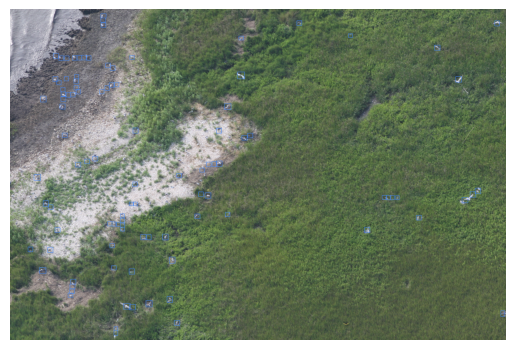

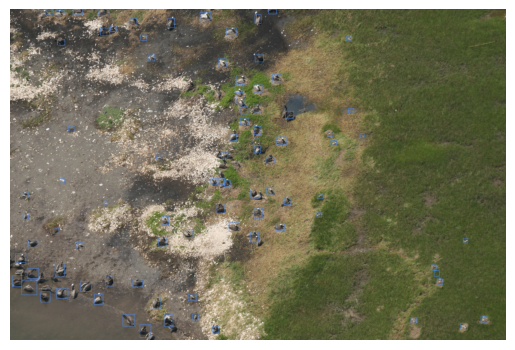

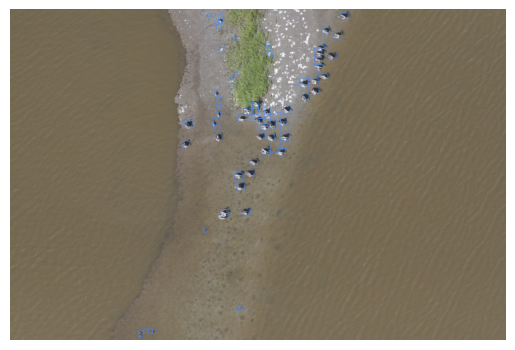

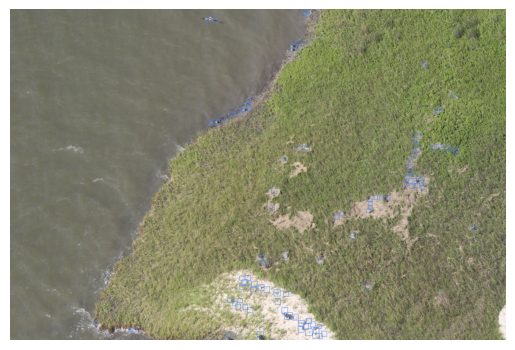

In [7]:
fine_tuned_predictions = []
for image in test_images:
    relative_path = os.path.join("data/DeepWaterHorizon", image)
    predictions = model.predict_image(path=relative_path)
    fine_tuned_predictions.append(predictions)
    visualize.plot_results(predictions)

# How many annotations do we need? 

Let's write a loop to split the train test data, fit the model, and evaluate the results. 


In [12]:
%%capture

import pandas as pd
import matplotlib.pyplot as plt

# Silence warnings and stdout
import warnings
warnings.filterwarnings("ignore")

# Get unique image names

results = []

train_fractions = [0, 0.05, 0.1, 0.5, 0.9]
for fraction in train_fractions:
    model = main.deepforest()
    model.load_model("Weecology/DeepForest-bird") 
    if not fraction == 0:
        train_images = train_annotations['image_path'].sample(frac=fraction, random_state=1).tolist()
        filtered_train = train_annotations[train_annotations['image_path'].isin(train_images)].copy(deep=True) 

        # Save temporary CSV files
        filtered_train.to_csv('data/temp_train.csv', index=False)

        # Configure model
        model.config["train"]["csv_file"] = 'data/temp_train.csv'
        model.config["train"]["root_dir"] = "data/DeepWaterHorizon"
        model.config["train"]["epochs"] = 20
        model.config["train"]["lr"] = 0.00001
        model.config["validation"]["val_accuracy_interval"] = 1
        model.config["train"]["batch_size"] = 6

        # Train model
        model.create_trainer()
        model.trainer.fit(model)

    # Evaluate on test set
    results_dict = model.evaluate(
        csv_file='data/temp_test.csv',
        root_dir='data/DeepWaterHorizon',
    )

    results.append({
        'train_fraction': fraction,
        'precision': results_dict['box_precision'],
        'recall': results_dict['box_recall'],
    })

    # Plot results
results_df = pd.DataFrame(results)

Trainer already configured with model summary callbacks: [<class 'pytorch_lightning.callbacks.model_summary.ModelSummary'>]. Skipping setting a default `ModelSummary` callback.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
Trainer already configured with model summary callbacks: [<class 'pytorch_lightning.callbacks.model_summary.ModelSummary'>]. Skipping setting a default `ModelSummary` callback.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [4]
Trainer already configured with model summary callbacks: [<class 'pytorch_lightning.callbacks.model_summary.ModelSummary'>]. Skipping setting a default `ModelSummary` callback.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
Trainer already configured with model summary callbacks: [<class 'pytorch_light

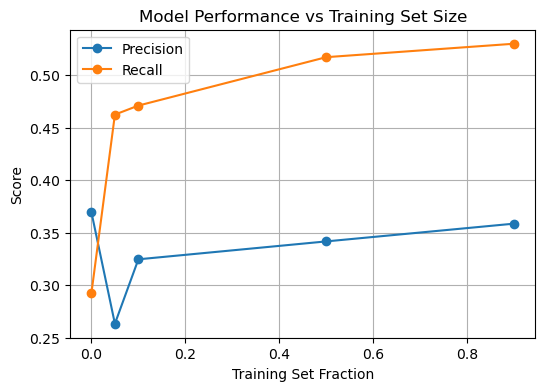

In [13]:
results_df = pd.DataFrame(results)
plt.figure(figsize=(6, 4))
plt.plot(results_df['train_fraction'], results_df['precision'], 'o-', label='Precision')
plt.plot(results_df['train_fraction'], results_df['recall'], 'o-', label='Recall')
plt.xlabel('Training Set Fraction')
plt.ylabel('Score')
plt.title('Model Performance vs Training Set Size')
plt.legend()
plt.grid(True)
plt.show()

### Optional split orthomosaic into tiles

Often we have images that are too large to run into training. DeepForest has tools to split them into pieces. 
The key aspect is the patch size and overlap. The patch size can have an effect on model performance. It is important to try different patch sizes and overlaps to find the best performance. This is an area of active research. 
This function can take in annotations and return only the crops that have overlapping annotations, or it can be used to split the image into crops without annotations. Use allow_empty=False to return only the crops that have overlapping annotations. 

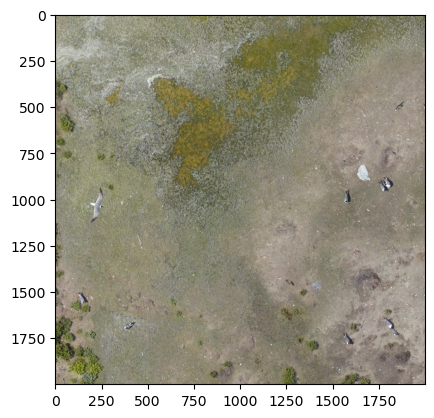

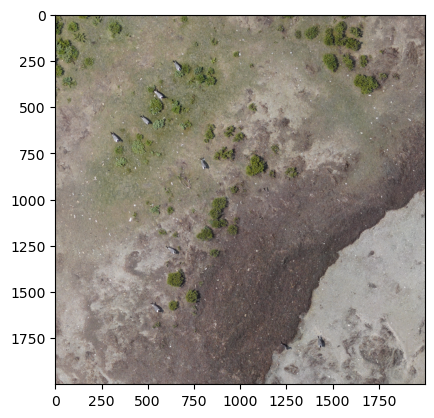

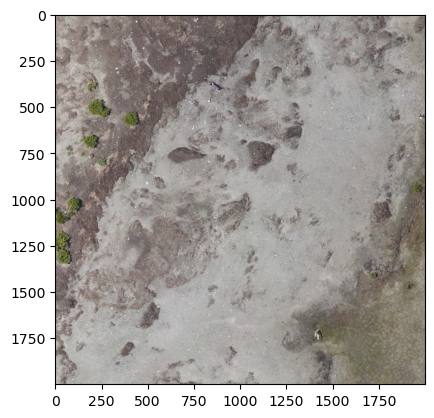

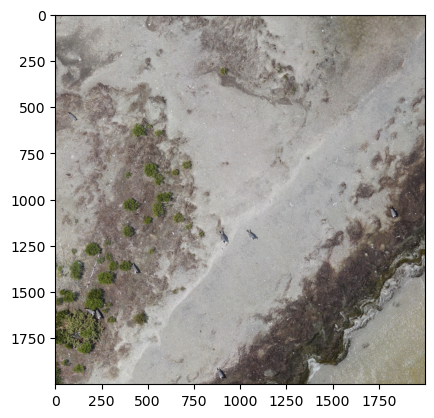

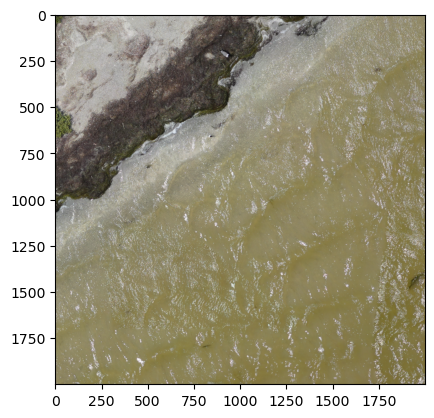

In [10]:
from deepforest.preprocess import split_raster
import os
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show

image_path = "data/DeepWaterHorizon/East_Pita_Yearly_2024-2-1.tif"
output_dir = "data/crops"
os.makedirs(output_dir, exist_ok=True)

# In this case we have no annotations, but in other cases we could use them to split the image into crops, only keeping rames with annotations, allow_empty=False.
crop_annotations = split_raster(
    path_to_raster=image_path,
    annotations_file=None,
    base_dir=output_dir,
    patch_size=2000,
    patch_overlap=0,
    allow_empty=True
)

# Plot a few crops
for crop in crop_annotations[:5]:
    # Read the crop
    crop_image = rasterio.open(crop).read([1,2,3])
    show(crop_image)

We can combine the steps and cut into pieces, predict on pieces and mosaic the pieces back together. In addition, we can perform overlapping box suppression to avoid double counting on edges.

In [15]:
# Read ortho using rasterio drop alpha channel, transpose to channels first
from deepforest import utilities
from shapely import geometry
raster = rasterio.open(image_path).read([1,2,3])
channels_first = raster.transpose(1, 2, 0)
orthomosaic_predition = model.predict_tile(image=channels_first, patch_size=2000, patch_overlap=0)
orthomosaic_predition["image_path"] = os.path.basename(image_path)

# Export as a shapefile
geo_coords = utilities.image_to_geo_coordinates(orthomosaic_predition, root_dir=os.path.dirname(image_path))
print(geo_coords.head())
geo_coords.to_file("data/DeepWaterHorizon/orthomosaic_predictions.shp")

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [4]


Predicting DataLoader 0: 100%|██████████| 25/25 [00:01<00:00, 16.22it/s]
1817 predictions in overlapping windows, applying non-max supression
1817 predictions kept after non-max suppression
     xmin    ymin    xmax    ymax label     score  \
0  1417.0  3749.0  1457.0  3793.0  Bird  0.654895   
1  2674.0   957.0  2720.0   994.0  Bird  0.649724   
2   641.0  2265.0   682.0  2305.0  Bird  0.649218   
3   380.0  1662.0   430.0  1705.0  Bird  0.623460   
4  2359.0  1149.0  2400.0  1192.0  Bird  0.599378   

                                            geometry  \
0  POLYGON ((-97.26419 27.59255, -97.26419 27.592...   
1  POLYGON ((-97.26413 27.59268, -97.26413 27.592...   
2  POLYGON ((-97.26423 27.59262, -97.26423 27.592...   
3  POLYGON ((-97.26424 27.59265, -97.26424 27.592...   
4  POLYGON ((-97.26414 27.59267, -97.26414 27.592...   

                      image_path  
0  East_Pita_Yearly_2024-2-1.tif  
1  East_Pita_Yearly_2024-2-1.tif  
2  East_Pita_Yearly_2024-2-1.tif  
3  East_Pita_Y

# The future of DeepForest

DeepForest was originally written as a single reproducible eample for a paper in 2018. It never occured to us that we would be designing a general airborne object detection package. However, the demand in the community, the constant requests for help, and the general need in the space has led us to develop a more general package. We are aiming for DeepForest 2.0 by next year that will have point, polygon and box support, robust classficiation and two-stage workflows and several new biodiversity models. We welcome feedback on the DeepForest github repo about your needs and ideas. 

DeepForest needs your help! We are looking for people to help with the development of the package. If you are interested in contributing to the project, please contact us on the github repo. Submit issues for everything, no item is too small to be improved. The docs, the naming of functions, everything can be simpler and we want to hear from you.